##Exploring Disneyland Visitor Reviews: An NLP Approach


In [ ]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re

# Download required NLTK data
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

##Data import from Kaggle

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("arushchillar/disneyland-reviews")

print("Path to dataset files:", path)

# Read the data
df = pd.read_csv(path+"/DisneylandReviews.csv",
                 delimiter=',', encoding='latin-1')

100%|██████████| 11.1M/11.1M [00:01<00:00, 8.67MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/arushchillar/disneyland-reviews/versions/1


##Preprocessing: tokenization, lemmatization and stop words removal

In [ ]:
#Based on Gordeliy, I. 2025. Frequency distribution and wordclouds. GitHub.
def preprocess_text(text):

    # Convert to lowercase
    text = str(text).lower()

    # Remove special characters and numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)

    # Tokenize
    tokens = word_tokenize(text)

    # Lemmatize
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]

    # Remove stopwords
    stop_words = set(stopwords.words('english'))

    # Add custom stopwords relevant to Disneyland reviews
    stop_words |= set(['disney', 'disneyland', 'park', 'parks','u','ride','ha','went','get','got','wa','one','go','day','year','year old','old','hong','kong','hong kong','hk','paris','california'])
    tokens = [token for token in tokens if token not in stop_words]

    return ' '.join(tokens)

##Word clouds without bigrams

In [ ]:
#Based on Gordeliy, I. 2025. Frequency distribution and wordclouds. GitHub.
def create_wordcloud(text, title):

    wordcloud = WordCloud(width=800, height=400,colormap='winter', background_color='white', prefer_horizontal=1.0).generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.tight_layout(pad=0)
    plt.savefig(f'wordcloud_{title.lower().replace(" ", "_")}.png')
    plt.show()

##Bigrams extraction and Word Clouds

In [ ]:
#AI recommendations
from sklearn.feature_extraction.text import CountVectorizer # Extracts bigrams from text.
from wordcloud import WordCloud #Creates a word cloud visualization.
import matplotlib.pyplot as plt # Displays and saves the word cloud image

def create_wordcloud_bigrams(text, title):
    """Generates a word cloud with bigrams."""

    # Extract bigrams from text (2 word combinations)
    vectorizer = CountVectorizer(ngram_range=(2, 2))

    X = vectorizer.fit_transform([text])
    #Creates a sparse matrix where each row represents a document, and each column represents a bigram.

    bigram_freq = dict(zip(vectorizer.get_feature_names_out(), X.toarray().sum(axis=0)))
    #Count Bigram Frequencies and stores it as dictionary

    # Generate word cloud from bigram frequencies
    wordcloud_bigrams = WordCloud(width=800, height=400, colormap='winter', background_color='white',
                          prefer_horizontal=1.0).generate_from_frequencies(bigram_freq)

    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_bigrams, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.tight_layout(pad=0)

    # Save word cloud as PNG
    plt.savefig(f'wordcloud_bigrams{title.lower().replace(" ", "_")}.png')
    plt.show()


##Plotting the frequency bar chart

In [ ]:
#Based on Gordeliy, I. 2025. Frequency distribution and wordclouds. GitHub.
def plot_word_frequency(text, title, top_n=30):

    words = text.split()
    word_freq = Counter(words).most_common(top_n)

    words, freqs = zip(*word_freq)

    plt.figure(figsize=(12, 6))
    sns.barplot(x=list(freqs), y=list(words))
    plt.title(f'Top {top_n} Words - {title}')
    plt.xlabel('Frequency')
    plt.ylabel('Words')
    plt.tight_layout()
    plt.savefig(f'word_freq_{title.lower().replace(" ", "_")}.png')
    plt.show()

##Analyzing monthly trends and Plots

High rating = 5 stars and Low Rating=1 star

In [ ]:
#AI recommendations
def calculate_monthly_percentage(group_data, total_data, month):

    total_reviews = len(total_data[total_data['Month'] == month])
    if total_reviews == 0:
        return 0.0
    return (len(group_data) / total_reviews) * 100

def analyze_monthly_ratings_high(df, branch):

    df_copy = df.copy()

    # Extract month from Year_Month, handling missing values
    df_copy['Month'] = pd.to_numeric(
        df_copy['Year_Month'].str.split('-').str[1],
        errors='coerce'
    )

    # Drop rows with missing months
    df_copy = df_copy.dropna(subset=['Month'])
    df_copy['Month'] = df_copy['Month'].astype(int)

    # Filter for branch data first
    branch_data = df_copy[df_copy['Branch'] == branch]

    # Get high ratings for this branch
    high_ratings = branch_data[branch_data['Rating'].isin([5])]

    # Calculate monthly stats
    monthly_stats = []
    for month in range(1, 13):
        month_high_ratings = high_ratings[high_ratings['Month'] == month]
        month_total = branch_data[branch_data['Month'] == month]

        pct = calculate_monthly_percentage(month_high_ratings, branch_data, month)
        monthly_stats.append({
            'Month': month,
            'high_rating_pct': pct,
            'review_count': len(month_total)
        })

    monthly_stats = pd.DataFrame(monthly_stats)

    # Create the plot
    plt.figure(figsize=(12, 6))
    ax1 = plt.gca()
    ax2 = ax1.twinx()

    # Plot percentage line
    line1 = ax1.plot(monthly_stats['Month'], monthly_stats['high_rating_pct'],
                     color='green', marker='o', label='5-Star %')
    bars = ax2.bar(monthly_stats['Month'], monthly_stats['review_count'],
                   alpha=0.3, color='gray', label='Review Count')

    ax1.set_xlabel('Month')
    ax1.set_ylabel('Percentage of 5-Star Reviews', color='green')
    ax2.set_ylabel('Number of Reviews', color='gray')
    plt.xticks(range(1, 13))
    plt.title(f'High Ratings (5-Star) Analysis - {branch}')
    ax1.grid(True, linestyle='--', alpha=0.7)

    lines = line1 + [bars]
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper right')

    plt.tight_layout()
    plt.savefig(f'high_ratings_{branch.lower().replace(" ", "_")}.png')
    plt.show()

    print(f'\nHigh Ratings Analysis (5 Stars) for {branch}:')
    for _, row in monthly_stats.iterrows():
      print(f"Month {int(row['Month'])}: {row['high_rating_pct']:.1f}% 5-star reviews "
      f"(total reviews: {int(row['review_count'])})")


def analyze_monthly_ratings_low(df, branch):

    df_copy = df.copy()

    # Extract month from Year_Month, handling missing values
    df_copy['Month'] = pd.to_numeric(
        df_copy['Year_Month'].str.split('-').str[1],
        errors='coerce'
    )

    # Drop rows with missing months
    df_copy = df_copy.dropna(subset=['Month'])
    df_copy['Month'] = df_copy['Month'].astype(int)

    # Filter for branch data first
    branch_data = df_copy[df_copy['Branch'] == branch]

    # Get low ratings for this branch
    low_ratings = branch_data[branch_data['Rating'].isin([1])]

    # Calculate monthly stats
    monthly_stats = []
    for month in range(1, 13):
        month_low_ratings = low_ratings[low_ratings['Month'] == month]
        month_total = branch_data[branch_data['Month'] == month]

        pct = calculate_monthly_percentage(month_low_ratings, branch_data, month)
        monthly_stats.append({
            'Month': month,
            'low_rating_pct': pct,
            'review_count': len(month_total)
        })

    monthly_stats = pd.DataFrame(monthly_stats)

    # Create the plot
    plt.figure(figsize=(12, 6))
    ax1 = plt.gca()
    ax2 = ax1.twinx()

    # Plot percentage line
    line1 = ax1.plot(monthly_stats['Month'], monthly_stats['low_rating_pct'],
                     color='red', marker='o', label='1 Star %')
    bars = ax2.bar(monthly_stats['Month'], monthly_stats['review_count'],
                   alpha=0.3, color='gray', label='Review Count')

    ax1.set_xlabel('Month')
    ax1.set_ylabel('Percentage of 1 Star Reviews', color='red')
    ax2.set_ylabel('Number of Reviews', color='gray')
    plt.xticks(range(1, 13))
    plt.title(f'Low Ratings (1-Star) Analysis - {branch}')
    ax1.grid(True, linestyle='--', alpha=0.7)

    lines = line1 + [bars]
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper right')

    plt.tight_layout()
    plt.savefig(f'low_ratings_{branch.lower().replace(" ", "_")}.png')
    plt.show()

def calculate_monthly_percentage(group_data, total_data, month):

    total_reviews = len(total_data[total_data['Month'] == month])
    if total_reviews == 0:
        return 0.0
    return (len(group_data) / total_reviews) * 100

def analyze_monthly_ratings_high(df, branch):

    df_copy = df.copy()

    # Extract month from Year_Month, handling missing values
    df_copy['Month'] = pd.to_numeric(
        df_copy['Year_Month'].str.split('-').str[1],
        errors='coerce'
    )

    # Drop rows with missing months
    df_copy = df_copy.dropna(subset=['Month'])
    df_copy['Month'] = df_copy['Month'].astype(int)

    # Filter for branch data first
    branch_data = df_copy[df_copy['Branch'] == branch]

    # Get high ratings for this branch
    high_ratings = branch_data[branch_data['Rating'].isin([5])]

    # Calculate monthly stats
    monthly_stats = []
    for month in range(1, 13):
        month_high_ratings = high_ratings[high_ratings['Month'] == month]
        month_total = branch_data[branch_data['Month'] == month]

        pct = calculate_monthly_percentage(month_high_ratings, branch_data, month)
        monthly_stats.append({
            'Month': month,
            'high_rating_pct': pct,
            'review_count': len(month_total)
        })

    monthly_stats = pd.DataFrame(monthly_stats)

    # Create the plot
    plt.figure(figsize=(12, 6))
    ax1 = plt.gca()
    ax2 = ax1.twinx()

    # Plot percentage line
    line1 = ax1.plot(monthly_stats['Month'], monthly_stats['high_rating_pct'],
                     color='green', marker='o', label='5-Star %')
    bars = ax2.bar(monthly_stats['Month'], monthly_stats['review_count'],
                   alpha=0.3, color='gray', label='Review Count')

    ax1.set_xlabel('Month')
    ax1.set_ylabel('Percentage of 5-Star Reviews', color='green')
    ax2.set_ylabel('Number of Reviews', color='gray')
    plt.xticks(range(1, 13))
    plt.title(f'High Ratings (5-Star) Analysis - {branch}')
    ax1.grid(True, linestyle='--', alpha=0.7)

    lines = line1 + [bars]
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper right')

    plt.tight_layout()
    plt.savefig(f'high_ratings_{branch.lower().replace(" ", "_")}.png')
    plt.show()

    print(f'\nHigh Ratings Analysis (5 Stars) for {branch}:')
    for _, row in monthly_stats.iterrows():
      print(f"Month {int(row['Month'])}: {row['high_rating_pct']:.1f}% 5-star reviews "
      f"(total reviews: {int(row['review_count'])})")


def analyze_monthly_ratings_low(df, branch):

    df_copy = df.copy()

    # Extract month from Year_Month, handling missing values
    df_copy['Month'] = pd.to_numeric(
        df_copy['Year_Month'].str.split('-').str[1],
        errors='coerce'
    )

    # Drop rows with missing months
    df_copy = df_copy.dropna(subset=['Month'])
    df_copy['Month'] = df_copy['Month'].astype(int)

    # Filter for branch data first
    branch_data = df_copy[df_copy['Branch'] == branch]

    # Get low ratings for this branch
    low_ratings = branch_data[branch_data['Rating'].isin([1])]

    # Calculate monthly stats
    monthly_stats = []
    for month in range(1, 13):
        month_low_ratings = low_ratings[low_ratings['Month'] == month]
        month_total = branch_data[branch_data['Month'] == month]

        pct = calculate_monthly_percentage(month_low_ratings, branch_data, month)
        monthly_stats.append({
            'Month': month,
            'low_rating_pct': pct,
            'review_count': len(month_total)
        })

    monthly_stats = pd.DataFrame(monthly_stats)

    # Create the plot
    plt.figure(figsize=(12, 6))
    ax1 = plt.gca()
    ax2 = ax1.twinx()

    # Plot percentage line
    line1 = ax1.plot(monthly_stats['Month'], monthly_stats['low_rating_pct'],
                     color='red', marker='o', label='1-Star %')
    bars = ax2.bar(monthly_stats['Month'], monthly_stats['review_count'],
                   alpha=0.3, color='gray', label='Review Count')

    ax1.set_xlabel('Month')
    ax1.set_ylabel('Percentage of 1 Star Reviews', color='red')
    ax2.set_ylabel('Number of Reviews', color='gray')
    plt.xticks(range(1, 13))
    plt.title(f'Low Ratings (1-Star) Analysis - {branch}')
    ax1.grid(True, linestyle='--', alpha=0.7)

    lines = line1 + [bars]
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper right')

    plt.tight_layout()
    plt.savefig(f'low_ratings_{branch.lower().replace(" ", "_")}.png')
    plt.show()

    print(f"\nLow Ratings Analysis (1-Star) for {branch}:")
    for _, row in monthly_stats.iterrows():
        print(f'Month {int(row["Month"])}: {row["low_rating_pct"]:.1f}% 1-star reviews'
              f'(total reviews: {int(row["review_count"])})')

Analyzing the text data set


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


          Review_ID        Rating
count  4.265600e+04  42656.000000
mean   3.188553e+08      4.217695
std    1.657092e+08      1.063371
min    1.398724e+06      1.000000
25%    1.743274e+08      4.000000
50%    2.907583e+08      5.000000
75%    4.489579e+08      5.000000
max    6.708014e+08      5.000000

Summary Statistics:

Disneyland_HongKong:
total reviews : 9620
1-star reviews: 172 (1.8% of total reviews)
5-star reviews: 4517 (47.0% of total reviews)

Disneyland_California:
total reviews : 19406
1-star reviews: 499 (2.6% of total reviews)
5-star reviews: 12518 (64.5% of total reviews)

Disneyland_Paris:
total reviews : 13630
1-star reviews: 828 (6.1% of total reviews)
5-star reviews: 6111 (44.8% of total reviews)


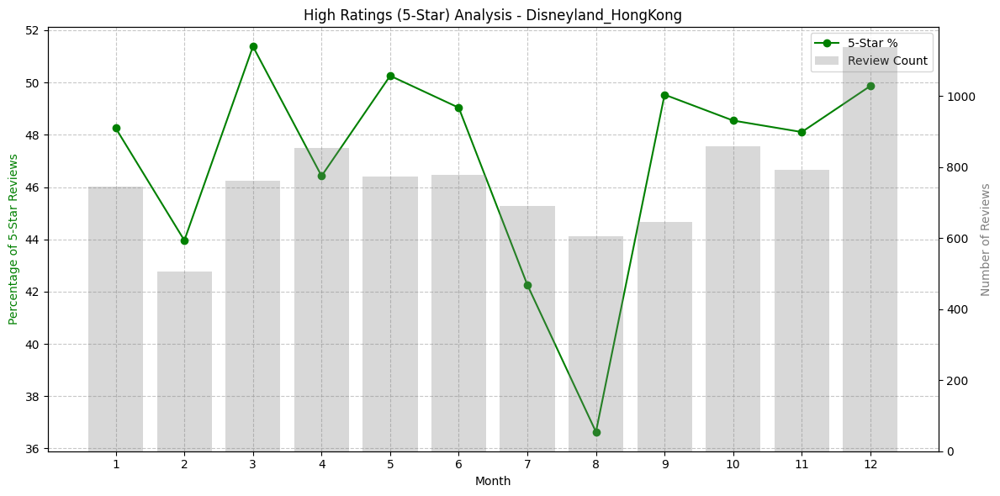


High Ratings Analysis (5 Stars) for Disneyland_HongKong:
Month 1: 48.3% 5-star reviews (total reviews: 744)
Month 2: 44.0% 5-star reviews (total reviews: 505)
Month 3: 51.4% 5-star reviews (total reviews: 761)
Month 4: 46.4% 5-star reviews (total reviews: 853)
Month 5: 50.3% 5-star reviews (total reviews: 774)
Month 6: 49.0% 5-star reviews (total reviews: 779)
Month 7: 42.3% 5-star reviews (total reviews: 691)
Month 8: 36.6% 5-star reviews (total reviews: 606)
Month 9: 49.5% 5-star reviews (total reviews: 646)
Month 10: 48.5% 5-star reviews (total reviews: 859)
Month 11: 48.1% 5-star reviews (total reviews: 792)
Month 12: 49.9% 5-star reviews (total reviews: 1137)


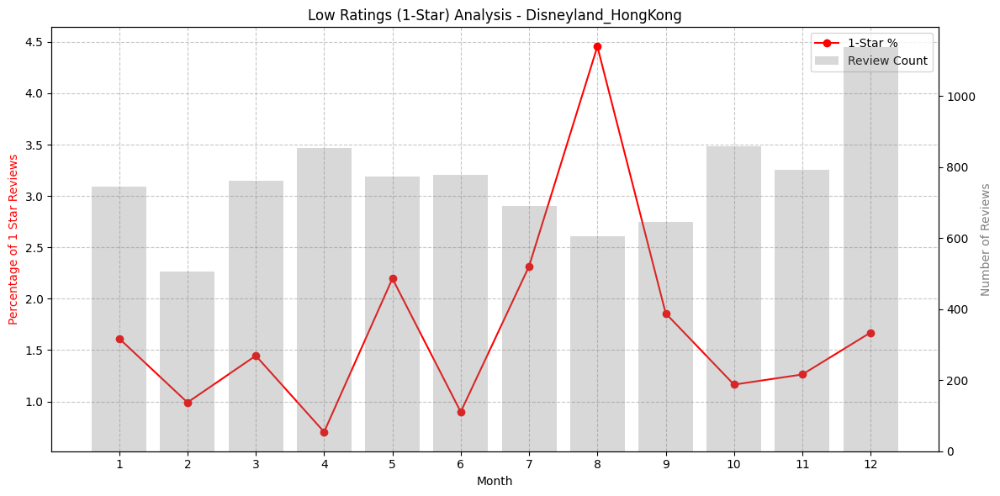


Low Ratings Analysis (1-Star) for Disneyland_HongKong:
Month 1: 1.6% 1-star reviews(total reviews: 744)
Month 2: 1.0% 1-star reviews(total reviews: 505)
Month 3: 1.4% 1-star reviews(total reviews: 761)
Month 4: 0.7% 1-star reviews(total reviews: 853)
Month 5: 2.2% 1-star reviews(total reviews: 774)
Month 6: 0.9% 1-star reviews(total reviews: 779)
Month 7: 2.3% 1-star reviews(total reviews: 691)
Month 8: 4.5% 1-star reviews(total reviews: 606)
Month 9: 1.9% 1-star reviews(total reviews: 646)
Month 10: 1.2% 1-star reviews(total reviews: 859)
Month 11: 1.3% 1-star reviews(total reviews: 792)
Month 12: 1.7% 1-star reviews(total reviews: 1137)


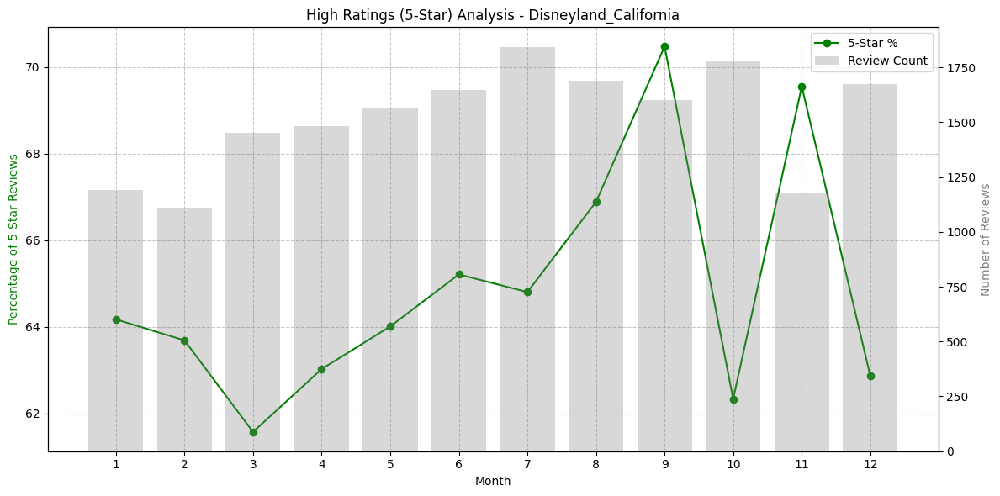


High Ratings Analysis (5 Stars) for Disneyland_California:
Month 1: 64.2% 5-star reviews (total reviews: 1189)
Month 2: 63.7% 5-star reviews (total reviews: 1107)
Month 3: 61.6% 5-star reviews (total reviews: 1452)
Month 4: 63.0% 5-star reviews (total reviews: 1482)
Month 5: 64.0% 5-star reviews (total reviews: 1567)
Month 6: 65.2% 5-star reviews (total reviews: 1647)
Month 7: 64.8% 5-star reviews (total reviews: 1841)
Month 8: 66.9% 5-star reviews (total reviews: 1688)
Month 9: 70.5% 5-star reviews (total reviews: 1602)
Month 10: 62.3% 5-star reviews (total reviews: 1776)
Month 11: 69.6% 5-star reviews (total reviews: 1179)
Month 12: 62.9% 5-star reviews (total reviews: 1672)


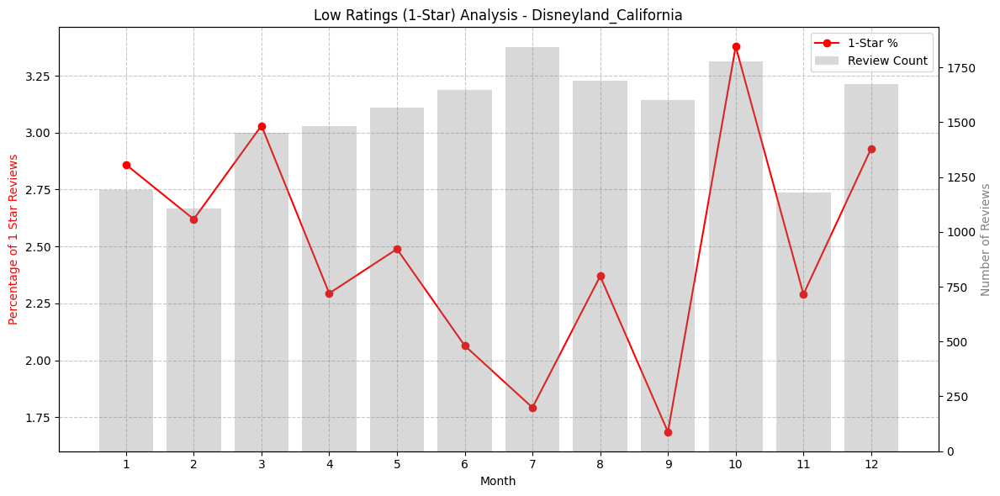


Low Ratings Analysis (1-Star) for Disneyland_California:
Month 1: 2.9% 1-star reviews(total reviews: 1189)
Month 2: 2.6% 1-star reviews(total reviews: 1107)
Month 3: 3.0% 1-star reviews(total reviews: 1452)
Month 4: 2.3% 1-star reviews(total reviews: 1482)
Month 5: 2.5% 1-star reviews(total reviews: 1567)
Month 6: 2.1% 1-star reviews(total reviews: 1647)
Month 7: 1.8% 1-star reviews(total reviews: 1841)
Month 8: 2.4% 1-star reviews(total reviews: 1688)
Month 9: 1.7% 1-star reviews(total reviews: 1602)
Month 10: 3.4% 1-star reviews(total reviews: 1776)
Month 11: 2.3% 1-star reviews(total reviews: 1179)
Month 12: 2.9% 1-star reviews(total reviews: 1672)


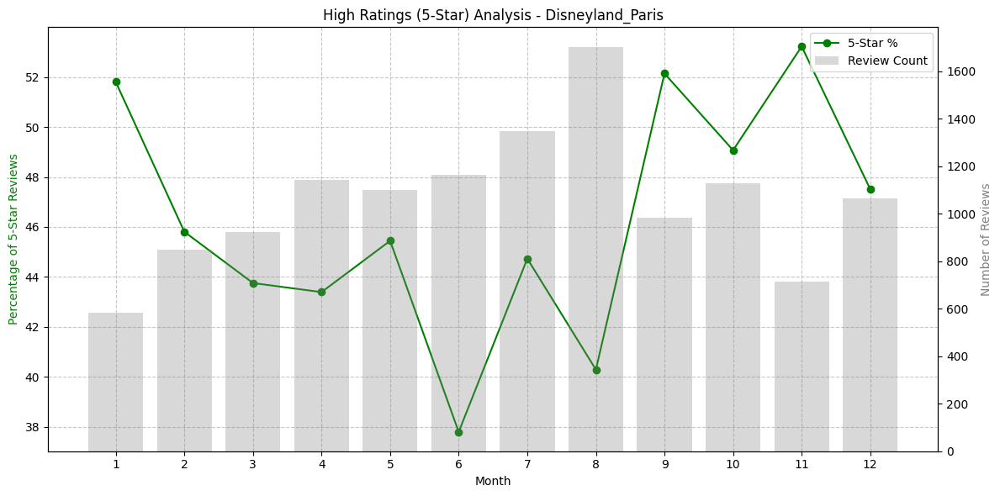


High Ratings Analysis (5 Stars) for Disneyland_Paris:
Month 1: 51.8% 5-star reviews (total reviews: 583)
Month 2: 45.8% 5-star reviews (total reviews: 847)
Month 3: 43.8% 5-star reviews (total reviews: 921)
Month 4: 43.4% 5-star reviews (total reviews: 1143)
Month 5: 45.4% 5-star reviews (total reviews: 1098)
Month 6: 37.8% 5-star reviews (total reviews: 1164)
Month 7: 44.7% 5-star reviews (total reviews: 1348)
Month 8: 40.3% 5-star reviews (total reviews: 1700)
Month 9: 52.1% 5-star reviews (total reviews: 982)
Month 10: 49.1% 5-star reviews (total reviews: 1129)
Month 11: 53.2% 5-star reviews (total reviews: 714)
Month 12: 47.5% 5-star reviews (total reviews: 1065)


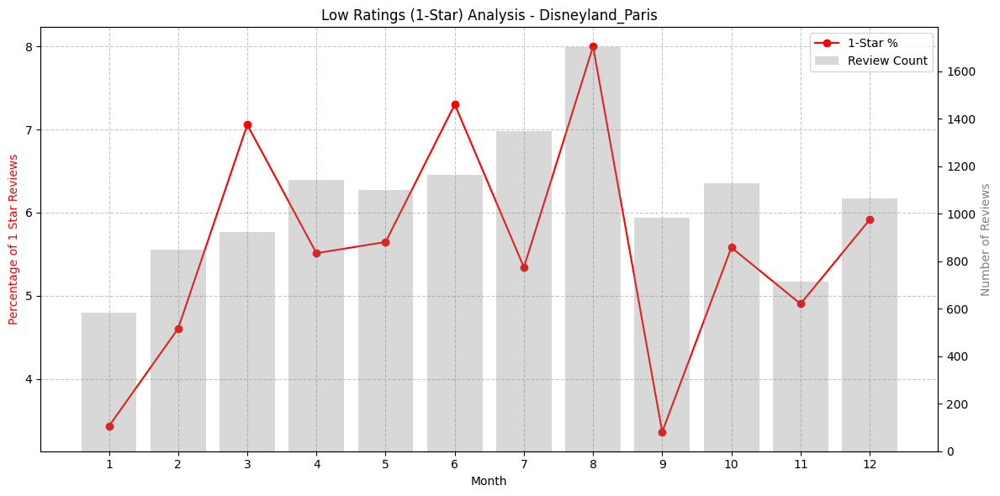


Low Ratings Analysis (1-Star) for Disneyland_Paris:
Month 1: 3.4% 1-star reviews(total reviews: 583)
Month 2: 4.6% 1-star reviews(total reviews: 847)
Month 3: 7.1% 1-star reviews(total reviews: 921)
Month 4: 5.5% 1-star reviews(total reviews: 1143)
Month 5: 5.6% 1-star reviews(total reviews: 1098)
Month 6: 7.3% 1-star reviews(total reviews: 1164)
Month 7: 5.3% 1-star reviews(total reviews: 1348)
Month 8: 8.0% 1-star reviews(total reviews: 1700)
Month 9: 3.4% 1-star reviews(total reviews: 982)
Month 10: 5.6% 1-star reviews(total reviews: 1129)
Month 11: 4.9% 1-star reviews(total reviews: 714)
Month 12: 5.9% 1-star reviews(total reviews: 1065)


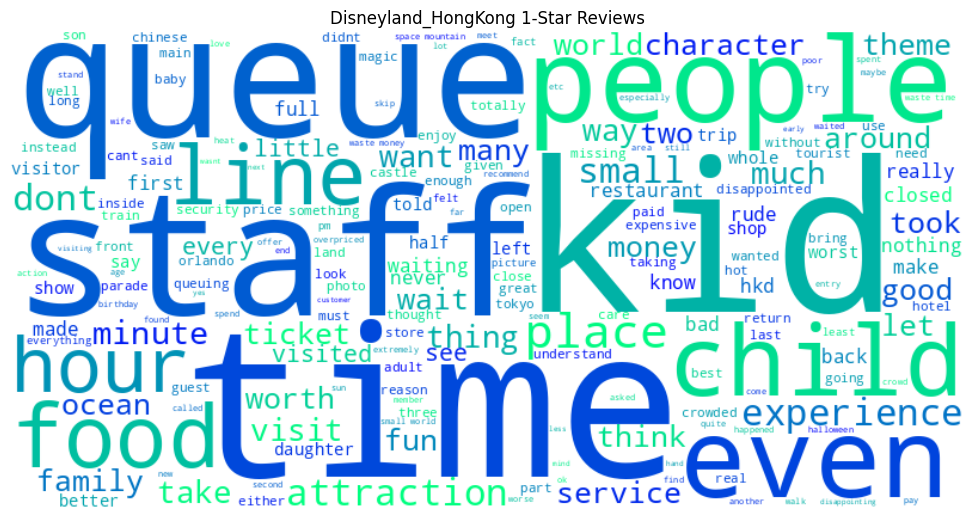

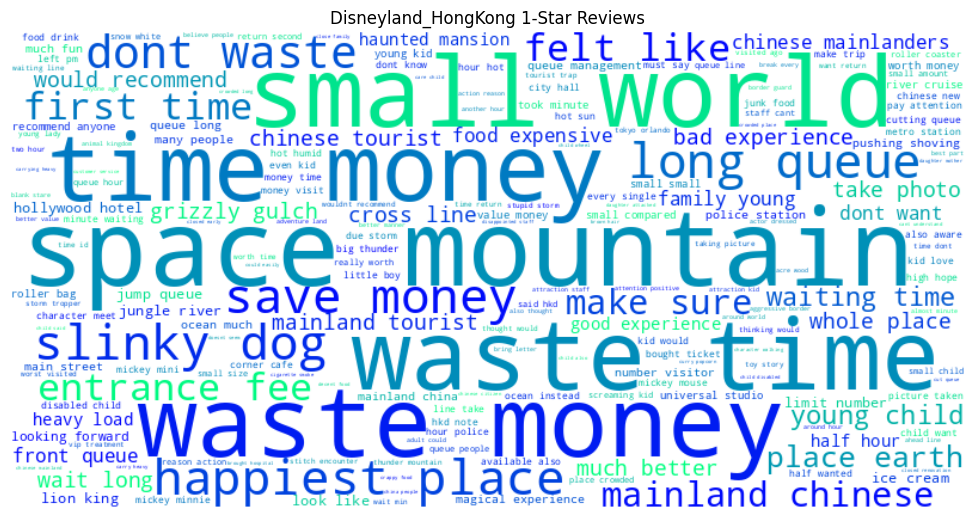

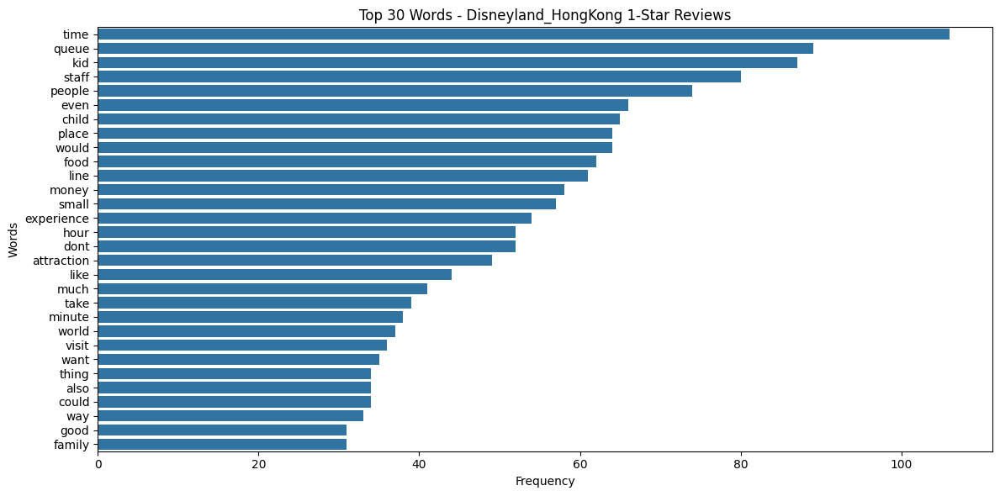

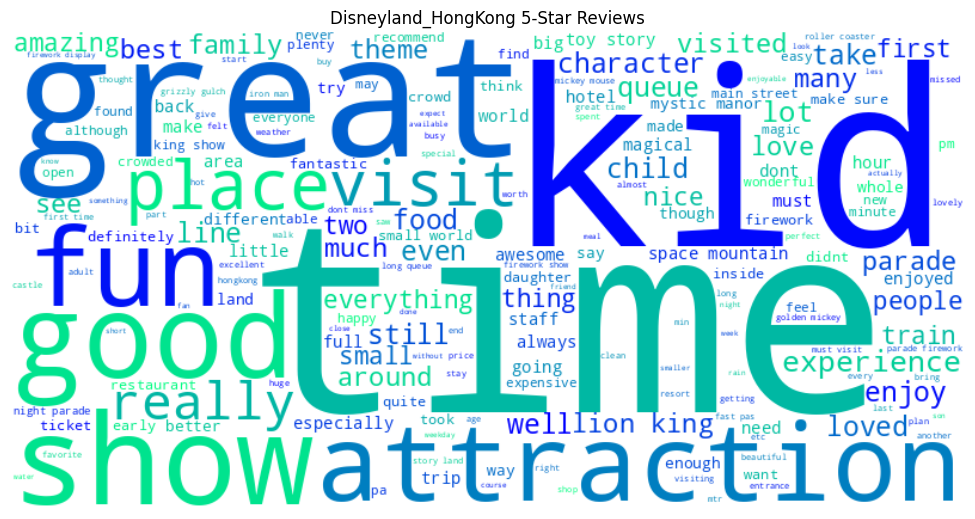

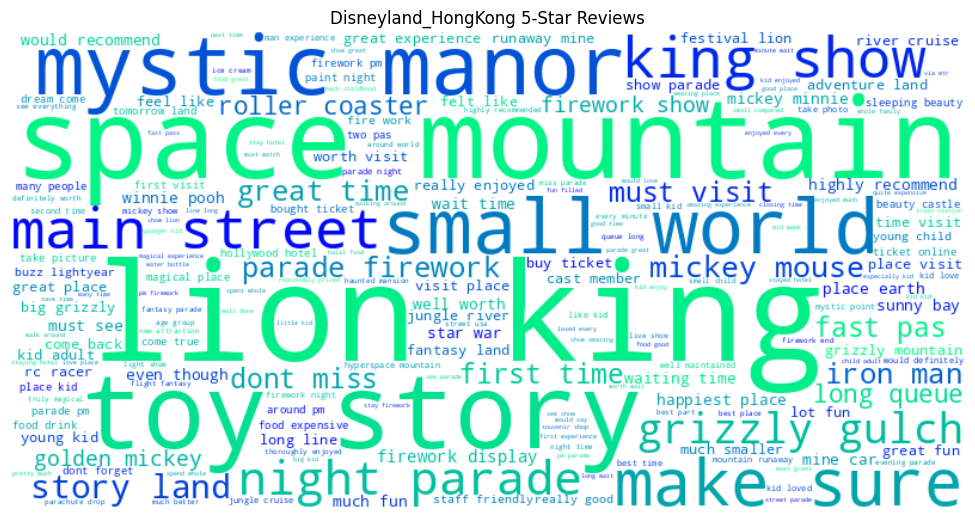

...

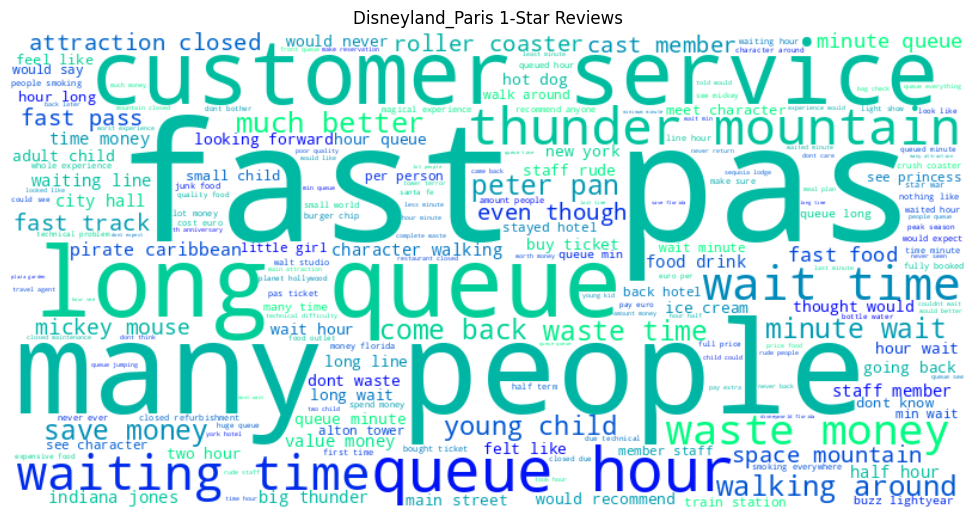

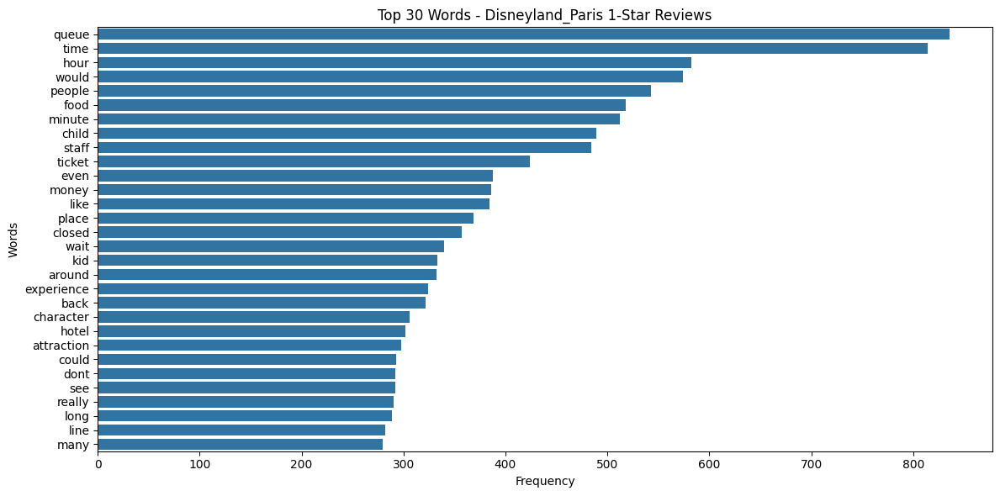

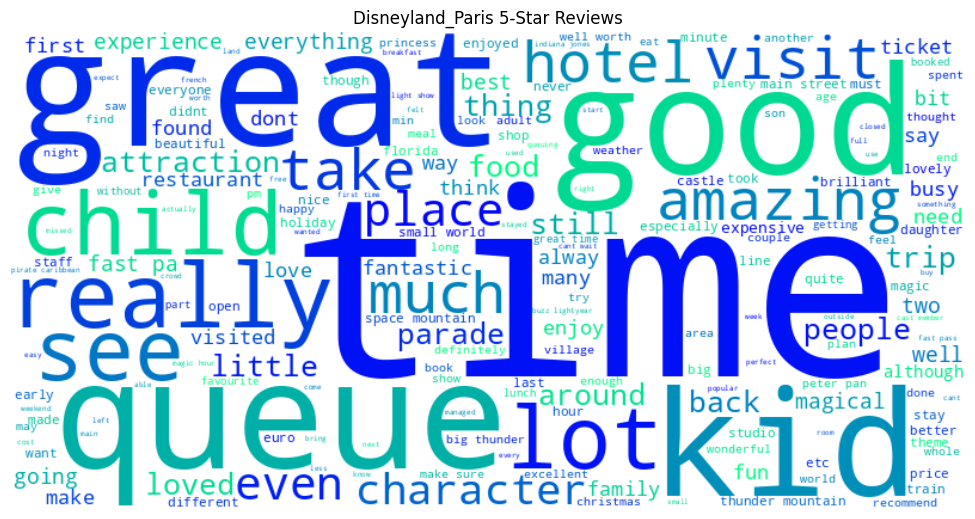

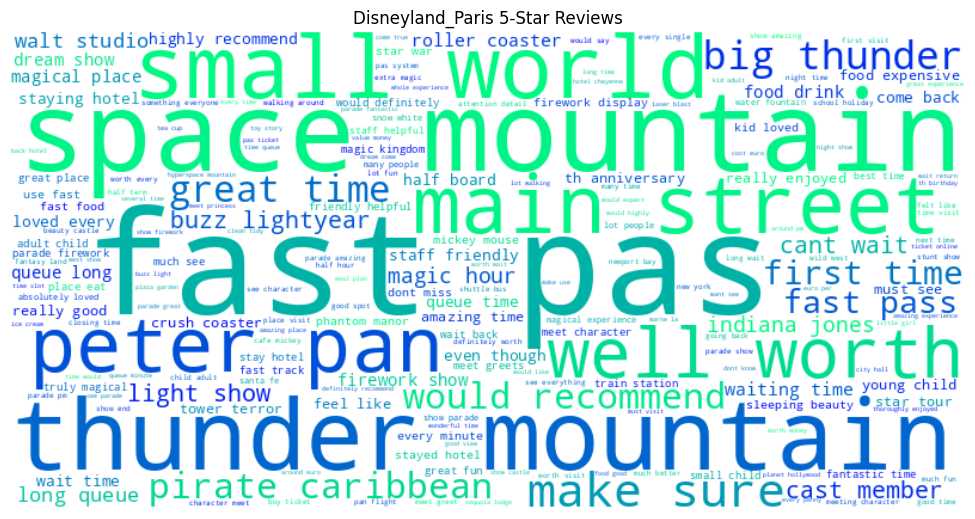

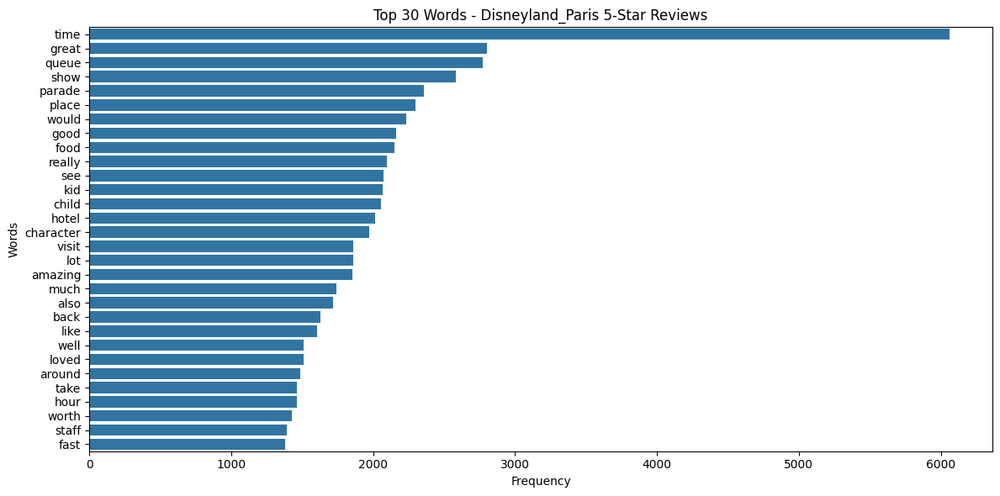

In [ ]:
nltk.download('punkt_tab')

def main():

    print(df.describe()) #summary statistics of the dataset

    # Preprocess reviews
    df['processed_text'] = df['Review_Text'].apply(preprocess_text)

    # Analyze for each branch and rating combination
    branches = df['Branch'].unique()
    ratings = [1, 5]  # We only want 1-star and 5-star reviews

    # Print summary statistics
    print('\nSummary Statistics:')
    for branch in branches:
        print(f"\n{branch}:")
        total = len(df[(df['Branch'] == branch)])
        print(f'total reviews : {total}')
        for rating in ratings:
            count = len(df[(df['Branch'] == branch) & (df['Rating'] == rating)])
            percentage = (count/total)*100
            print(f'{rating}-star reviews: {count} ({percentage:.1f}% of total reviews)')

    # First, perform the monthly rating analysis for each branch
    for branch in branches:
        analyze_monthly_ratings_high(df, branch)
        analyze_monthly_ratings_low(df, branch)

    # Then perform the word analysis
    for branch in branches:
        for rating in ratings:
            # Filter data
            mask = (df['Branch'] == branch) & (df['Rating'] == rating)
            reviews = df[mask]['processed_text']

            if len(reviews) > 0:
                # Combine all reviews for this branch and rating
                combined_text = ' '.join(reviews)

                # Create title for plots
                title = f'{branch} {rating}-Star Reviews'

                # Generate wordcloud
                create_wordcloud(combined_text, title)
                create_wordcloud_bigrams(combined_text, title)

                # Create frequency distribution plot
                plot_word_frequency(combined_text, title)


if __name__ == "__main__":
    main()

##Vectorization and topic modeling

In [ ]:
# built-in Python libraries
# -------------------------
import collections
import re
import string
import warnings
warnings.filterwarnings('ignore')


!pip install -U gensim

# Gensim for topic modeling
import gensim
# for loading data
import sklearn.datasets
# for LDA visualization
!pip install pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models

# for uploading data files
from google.colab import files


#REVIEW IF DUPLICATED
def text_to_lemma_frequencies(text, remove_stop_words=True):

    # split document into sentences
    sentences = nltk.sent_tokenize(text)

    # create a place to store (word, pos_tag) tuples
    words_and_pos_tags = []

    # get all words and pos tags
    for sentence in sentences:
        words_and_pos_tags += nltk.pos_tag(nltk.word_tokenize(sentence))

    # load the lemmatizer
    lemmatizer = nltk.stem.WordNetLemmatizer()

    # lemmatize the words
    lemmas = [lemmatizer.lemmatize(word,lookup_pos(pos)) for \
              (word,pos) in words_and_pos_tags]

    # convert to lowercase
    lowercase_lemmas = [lemma.lower() for lemma in lemmas]

    # load the stopword list for English
    stop_words = set([])
    if remove_stop_words:
        stop_words = set(nltk.corpus.stopwords.words('english'))

    # add punctuation to the set of things to remove
    all_removal_tokens = stop_words | set(string.punctuation)

    # bonus: also add some custom double-quote tokens to this set
    all_removal_tokens |= set(["''","``"])

    # only get lemmas that aren't in these lists
    content_lemmas = [lemma for lemma in lowercase_lemmas \
                      if lemma not in all_removal_tokens and \
                      re.match(r"^\w+$",lemma)]

    # return the frequency distribution object
    return nltk.probability.FreqDist(content_lemmas)

def docs2matrix(document_list):

    # use the vocab2index idea from before
    vocab2index = {}

    # load the stopword list for English
    stop_words = set(nltk.corpus.stopwords.words('english'))
    stop_words |= set(['from', 'subject', 're', 'edu', 'use'])

    # add punctuation to the set of things to remove
    all_removal_tokens = stop_words | set(string.punctuation)

    # bonus: also add some custom double-quote tokens to this set
    all_removal_tokens |= set(["''","``"])

    vocab2index = {}
    latest_index = 0

    lfs = []
    # this should be a nice starting point
    for doc in document_list:
        lf = text_to_lemma_frequencies(doc,all_removal_tokens)
        for token in lf.keys():
            if token not in vocab2index:
                vocab2index[token] = latest_index
                latest_index += 1

        lfs.append(lf)

    #create the zeros matrix
    corpus_matrix = np.zeros((len(lfs), len(vocab2index)))

    for row, lf in enumerate(lfs):
        for token, frequency in lf.items():
            column = vocab2index[token]
            corpus_matrix[row][column] = frequency

    return corpus_matrix, vocab2index


# Lemmatization -- redefining this here to make
# code block more self-contained
def lookup_pos(pos):
    pos_first_char = pos[0].lower()
    if pos_first_char in 'nv':
        return pos_first_char
    else:
        return 'n'

print()
print("Done with setup!")
print("If you'd like, you can click the (X) button to the left to clear this output.")



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 23.6 MB/s eta 0:00:00

Done with setup!
If you'd like, you can click the (X) button to the left to clear this output.


In [ ]:
import numpy as np
from gensim import corpora
import nltk
nltk.download('punkt_tab')
nltk.download('averaged_perceptron_tagger_eng')
# Download NLTK stopwords
nltk.download('punkt')
nltk.download('stopwords')

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
import numpy as np
import pandas as pd
import kagglehub
from gensim import corpora
import nltk

nltk.download('punkt_tab')
nltk.download('averaged_perceptron_tagger_eng')

# Download latest version of the dataset
path = kagglehub.dataset_download("arushchillar/disneyland-reviews")
print("Path to dataset files:", path)

# Load the dataset
df = pd.read_csv(path+"/DisneylandReviews.csv", delimiter=',', encoding='latin-1')

# Check the first few rows
print(df.head())



/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


Path to dataset files: /root/.cache/kagglehub/datasets/arushchillar/disneyland-reviews/versions/1
   Review_ID  Rating Year_Month     Reviewer_Location  \
0  670772142       4     2019-4             Australia   
1  670682799       4     2019-5           Philippines   
2  670623270       4     2019-4  United Arab Emirates   
3  670607911       4     2019-4             Australia   
4  670607296       4     2019-4        United Kingdom   

                                         Review_Text               Branch  
0  If you've ever been to Disneyland anywhere you...  Disneyland_HongKong  
1  Its been a while since d last time we visit HK...  Disneyland_HongKong  
2  Thanks God it wasn   t too hot or too humid wh...  Disneyland_HongKong  
3  HK Disneyland is a great compact park. Unfortu...  Disneyland_HongKong  
4  the location is not in the city, took around 1...  Disneyland_HongKong  


In [ ]:
#Dataset preparation for topic modeling for Rating=1 reviews

filtered_reviews_1_all = df[(df['Rating'] == 1)].copy()
filtered_reviews_1_all

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Review_ID,Rating,Year_Month,Reviewer_Location,Review_Text,Branch
101,662641193,1,2019-3,India,The main attractions were shut while we still ...,Disneyland_HongKong
144,658624005,1,2019-3,United Arab Emirates,"Visited Disneyland Hong Kong today March 15, 2...",Disneyland_HongKong
236,649615606,1,2019-2,Macau,"Every year I come to Disney with my children, ...",Disneyland_HongKong
255,647822351,1,2018-10,Canada,I'm writing an honest and truthful opinion of ...,Disneyland_HongKong
264,647328225,1,2019-1,Australia,"Visited from Australia. Enjoyed the rides, par...",Disneyland_HongKong
...,...,...,...,...,...,...
42572,5332097,1,missing,United Kingdom,Visited for four days end may 2006 and it was ...,Disneyland_Paris
42573,5322644,1,missing,Sweden,We visited Disneyland in Paris on the 4 June 2...,Disneyland_Paris
42608,3533406,1,missing,United Kingdom,Just returned from a disappointing trip to Dis...,Disneyland_Paris
42609,3460644,1,missing,United States,My husband and I recently returned from a long...,Disneyland_Paris


In [ ]:
import nltk
nltk.download('wordnet')
# Select the text column for analysis
documents = filtered_reviews_1_all['Review_Text'].dropna().tolist()  # Drop missing reviews


# Download NLTK stopwords
import nltk
from nltk.corpus import stopwords # Import stopwords module
nltk.download('punkt')
nltk.download('stopwords')
from nltk.tokenize import word_tokenize

stop_words = set(stopwords.words('english'))

# Function to preprocess text
def preprocess(text):
    tokens = word_tokenize(text.lower())  # Tokenize and lowercase
    tokens = [word for word in tokens if word.isalpha() and word not in stop_words]  # Remove stopwords & non-words
    return tokens

# Preprocess all reviews
processed_docs = [preprocess(doc) for doc in documents]

# Create a Gensim dictionary
dictionary = corpora.Dictionary(processed_docs)

# Convert documents to Bag-of-Words (BoW)
corpus = [dictionary.doc2bow(doc) for doc in processed_docs]

# using the function we wrote before, but modified to also return the vocab2index
corpus_matrix, word2id = docs2matrix(documents)
# reverse this dictionary
id2word = {v:k for k,v in word2id.items()}

corpus = gensim.matutils.Dense2Corpus(corpus_matrix, documents_columns=False)
print("Loaded",len(corpus),"documents into a Gensim corpus.")


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Loaded 1499 documents into a Gensim corpus.


In [ ]:
warnings.filterwarnings('ignore')


# run LDA on our corpus, using out dictionary (k=6)
lda = gensim.models.LdaModel(corpus, id2word=id2word, num_topics=6, passes = 10, iterations = 200, random_state=42)
lda.print_topics()

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.009*"park" + 0.009*"disneyland" + 0.009*"disney" + 0.006*"go" + 0.006*"ride" + 0.006*"visit" + 0.006*"staff" + 0.006*"time" + 0.006*"paris" + 0.006*"get"'),
 (1,
  '0.017*"ride" + 0.015*"get" + 0.014*"park" + 0.014*"go" + 0.013*"queue" + 0.011*"disney" + 0.010*"day" + 0.008*"would" + 0.008*"time" + 0.007*"people"'),
 (2,
  '0.015*"ticket" + 0.014*"park" + 0.012*"day" + 0.011*"disney" + 0.010*"wait" + 0.009*"ride" + 0.007*"place" + 0.007*"get" + 0.006*"time" + 0.006*"tell"'),
 (3,
  '0.021*"park" + 0.019*"ride" + 0.015*"disney" + 0.014*"go" + 0.012*"get" + 0.012*"time" + 0.011*"wait" + 0.010*"day" + 0.009*"disneyland" + 0.009*"line"'),
 (4,
  '0.023*"disneyland" + 0.013*"go" + 0.012*"ride" + 0.011*"disney" + 0.010*"park" + 0.009*"time" + 0.007*"day" + 0.007*"money" + 0.007*"get" + 0.007*"line"'),
 (5,
  '0.018*"disney" + 0.014*"park" + 0.012*"go" + 0.009*"place" + 0.009*"time" + 0.007*"money" + 0.007*"disneyland" + 0.007*"year" + 0.006*"one" + 0.006*"day"')]

Deleting additional words to make facilitate topic identification

In [ ]:
import numpy as np
import gensim

# Compute total word frequencies
total_counts = np.sum(corpus_matrix, axis=0)

# Sort words by frequency
sorted_words = sorted(zip(range(len(total_counts)), total_counts), key=lambda x: x[1], reverse=True)

# Define thresholds
N = 100  # Remove top N most frequent words
M = 50   # Remove words appearing less than M times

# Get indexes of words to remove
top_N_ids = [item[0] for item in sorted_words[:N]]
appears_less_than_M_times = [item[0] for item in sorted_words if item[1] < M]

# Ensure that `vocab_dense` only contains actual words
vocab_dense = [id2word[idx] for idx in range(len(id2word)) if id2word[idx].isalpha()]  # Keep only words

print("Top words to remove:", ' '.join([id2word[idx] for idx in top_N_ids if idx < len(vocab_dense)]))

# Ensure all indexes are valid
remove_indexes = [idx for idx in (top_N_ids + appears_less_than_M_times) if idx < len(vocab_dense)]
remove_indexes = sorted(set(remove_indexes), reverse=True)  # Remove duplicates and sort descending

# Remove words safely
for index in remove_indexes:
    if index < len(vocab_dense):
        del vocab_dense[index]

# Ensure valid column removal from corpus_matrix
remove_indexes = [idx for idx in remove_indexes if idx < corpus_matrix.shape[1]]
corpus_matrix_filtered = np.delete(corpus_matrix, remove_indexes, axis=1)

# Update id2word and word2id dictionaries
id2word_filtered = {i: word for i, word in enumerate(vocab_dense)}
word2id_filtered = {word: i for i, word in id2word_filtered.items()}

# Convert to Gensim Corpus
corpus_filtered = gensim.matutils.Dense2Corpus(corpus_matrix_filtered, documents_columns=False)

print("Original matrix shape:", corpus_matrix.shape)
print("New matrix shape:", corpus_matrix_filtered.shape)

Top words to remove: park ride go disney get time day disneyland queue wait one people would hour line minute food place staff child even could ticket money u 2 visit like take year say kid make see back paris close experience many tell long pay around want 3 fast really two never attraction family crowd way much find think come spend walk hotel character leave good try old give price need thing look first service break pas also show 4 better know restaurant use stand expensive 1 open trip work expect 5 last well every small ask lot parade world rude another waste
Original matrix shape: (1499, 9734)
New matrix shape: (1499, 963)


In [ ]:
import gensim

# Recreating dictionary
dictionary_filtered = gensim.corpora.Dictionary(processed_docs)
dictionary_filtered.filter_extremes(no_below=M, no_above=1.0, keep_n=None) # This is a method to remove words based on your frequency thresholds (N and M)

# Converting filtered documents to BoW using the filtered dictionary
corpus_filtered = [dictionary_filtered.doc2bow(doc) for doc in processed_docs]

# Updated id2word from the filtered dictionary
id2word_filtered = dictionary_filtered

# Traiing LDA model using the filtered corpus and updated dictionary
lda = gensim.models.LdaModel(corpus_filtered,
                            id2word=id2word_filtered,
                            num_topics=6,
                            passes=10,
                            iterations=200,
                            random_state=200)

lda.print_topics()

[(0,
  '0.022*"people" + 0.021*"park" + 0.019*"get" + 0.018*"rides" + 0.017*"queue" + 0.013*"ride" + 0.013*"go" + 0.013*"day" + 0.013*"one" + 0.013*"disneyland"'),
 (1,
  '0.041*"park" + 0.021*"line" + 0.020*"ride" + 0.017*"day" + 0.017*"minutes" + 0.015*"one" + 0.014*"time" + 0.014*"disney" + 0.013*"get" + 0.012*"lines"'),
 (2,
  '0.040*"disney" + 0.028*"park" + 0.020*"staff" + 0.019*"food" + 0.015*"rides" + 0.014*"disneyland" + 0.013*"like" + 0.012*"go" + 0.012*"paris" + 0.011*"people"'),
 (3,
  '0.034*"rides" + 0.029*"disney" + 0.028*"park" + 0.020*"closed" + 0.017*"day" + 0.016*"disneyland" + 0.014*"paris" + 0.013*"one" + 0.012*"money" + 0.011*"go"'),
 (4,
  '0.029*"disney" + 0.020*"us" + 0.019*"would" + 0.018*"disneyland" + 0.016*"get" + 0.016*"told" + 0.014*"park" + 0.013*"one" + 0.012*"could" + 0.012*"back"'),
 (5,
  '0.032*"wait" + 0.024*"rides" + 0.021*"time" + 0.021*"line" + 0.020*"park" + 0.019*"go" + 0.018*"money" + 0.017*"ride" + 0.017*"get" + 0.016*"lines"')]

In [ ]:
import pandas as pd
import kagglehub

# Download latest version
path = kagglehub.dataset_download("arushchillar/disneyland-reviews")

print("Path to dataset files:", path)

# Read the data
df = pd.read_csv(path+"/DisneylandReviews.csv",
                 delimiter=',', encoding='latin-1')

Path to dataset files: /root/.cache/kagglehub/datasets/arushchillar/disneyland-reviews/versions/1


In [ ]:
import gensim
from sklearn.feature_extraction.text import TfidfTransformer
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re


import gensim
from sklearn.feature_extraction.text import TfidfTransformer

# Compute TF-IDF transformation
tfidf_transformer = TfidfTransformer()
corpus_tfidf = tfidf_transformer.fit_transform(corpus_matrix)  # Apply TF-IDF

# Convert sparse matrix to NumPy array
tfidf_array = corpus_tfidf.toarray()

# Compute total word importance (average TF-IDF per word)
average_tfidf = np.mean(tfidf_array, axis=0)  # Average TF-IDF score per word across all documents

# Compute document frequency (how many documents contain each word)
doc_freq = np.sum(corpus_matrix > 0, axis=0).flatten()  # Number of documents in which each word appears

# Sort words by TF-IDF importance (descending)
sorted_words = sorted(zip(range(len(average_tfidf)), average_tfidf), key=lambda x: x[1], reverse=True)

# Define thresholds
N = 100   # Remove top N most important words (highest average TF-IDF)
M = 50  # Remove words appearing in fewer than M documents

# Get indexes of words to remove
top_N_ids = [item[0] for item in sorted_words[:N]]  # Top N based on highest TF-IDF scores
low_doc_freq_ids = [idx for idx in range(len(doc_freq)) if doc_freq[idx] < M]  # Low-frequency words

# Ensure that `vocab_dense` only contains actual words (no special chars or stopwords)
vocab_dense = [id2word[idx] for idx in range(len(id2word)) if id2word[idx].isalpha()]  # Keep only valid words

# Print top words being removed (those with high TF-IDF)
print("Top words to remove (high TF-IDF):", ' '.join([id2word[idx] for idx in top_N_ids if idx < len(vocab_dense)]))

# Ensure valid indexes to remove
remove_indexes = sorted(set(top_N_ids + low_doc_freq_ids), reverse=True)  # Remove duplicates and sort

# Remove words safely from `vocab_dense`
for index in remove_indexes:
    if index < len(vocab_dense):
        del vocab_dense[index]

# Ensure valid column removal from corpus_matrix
remove_indexes = [idx for idx in remove_indexes if idx < corpus_matrix.shape[1]]
corpus_matrix_filtered = np.delete(tfidf_array, remove_indexes, axis=1)  # Remove corresponding columns

# Update id2word and word2id dictionaries
id2word_filtered = {i: word for i, word in enumerate(vocab_dense)}
word2id_filtered = {word: i for i, word in id2word_filtered.items()}

# Convert to Gensim Corpus (after filtering)
corpus_filtered_TF_IDF = gensim.matutils.Dense2Corpus(corpus_matrix_filtered, documents_columns=False)

print("Original matrix shape:", corpus_matrix.shape)
print("TF-IDF matrix shape:", corpus_tfidf.shape)
print("Filtered matrix shape:", corpus_matrix_filtered.shape)


Top words to remove (high TF-IDF): ride park disney go get time queue day disneyland wait line hour people one would money food place ticket staff minute visit close kid child 2 even like paris year long many attraction could back experience take u see pay make say crowd fast 3 never two really around spend tell much price want family way come character expensive waste find break hotel think walk old pas good leave thing better need 4 try service florida look 1 give rude also small world first restaurant open nothing work show use every last stand 5 min bad lot trip know buy
Original matrix shape: (1499, 9734)
TF-IDF matrix shape: (1499, 9734)
Filtered matrix shape: (1499, 358)


In [ ]:
import gensim

# Recreating dictionary
dictionary_filtered = gensim.corpora.Dictionary(processed_docs)
dictionary_filtered.filter_extremes(no_below=M, no_above=1.0, keep_n=None) # This is a method to remove words based on your frequency thresholds (N and M)

# Converting filtered documents to BoW using the filtered dictionary
corpus_filtered_TF_IDF = [dictionary_filtered.doc2bow(doc) for doc in processed_docs]

# Updated id2word from the filtered dictionary
id2word_filtered = dictionary_filtered

# Traiing LDA model using the filtered corpus and updated dictionary
lda = gensim.models.LdaModel(corpus_filtered_TF_IDF,
                            id2word=id2word_filtered,
                            num_topics=6,
                            passes=10,
                            iterations=200,
                            random_state=200)

lda.print_topics()

[(0,
  '0.022*"people" + 0.021*"park" + 0.019*"get" + 0.018*"rides" + 0.017*"queue" + 0.013*"ride" + 0.013*"go" + 0.013*"day" + 0.013*"one" + 0.013*"disneyland"'),
 (1,
  '0.041*"park" + 0.021*"line" + 0.020*"ride" + 0.017*"day" + 0.017*"minutes" + 0.015*"one" + 0.014*"time" + 0.014*"disney" + 0.013*"get" + 0.012*"lines"'),
 (2,
  '0.040*"disney" + 0.028*"park" + 0.020*"staff" + 0.019*"food" + 0.015*"rides" + 0.014*"disneyland" + 0.013*"like" + 0.012*"go" + 0.012*"paris" + 0.011*"people"'),
 (3,
  '0.034*"rides" + 0.029*"disney" + 0.028*"park" + 0.020*"closed" + 0.017*"day" + 0.016*"disneyland" + 0.014*"paris" + 0.013*"one" + 0.012*"money" + 0.011*"go"'),
 (4,
  '0.029*"disney" + 0.020*"us" + 0.019*"would" + 0.018*"disneyland" + 0.016*"get" + 0.016*"told" + 0.014*"park" + 0.013*"one" + 0.012*"could" + 0.012*"back"'),
 (5,
  '0.032*"wait" + 0.024*"rides" + 0.021*"time" + 0.021*"line" + 0.020*"park" + 0.019*"go" + 0.018*"money" + 0.017*"ride" + 0.017*"get" + 0.016*"lines"')]

In [ ]:
!pip install pyLDAvis
import pyLDAvis
import gensim

pyLDAvis.enable_notebook()


dictionary = gensim.corpora.Dictionary() #genism dictionary created as this is what pyLDA expects as input
dictionary.token2id = word2id_filtered

# visualize the LDA model
vis = pyLDAvis.gensim_models.prepare(lda, corpus_filtered, dictionary_filtered)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.002574 -0.009860       1        1  23.978186
4      0.046711 -0.063995       2        1  19.454312
3      0.015586  0.035678       3        1  17.709709
2      0.054913  0.058507       4        1  16.236356
1     -0.013384 -0.032588       5        1  12.057856
5     -0.101252  0.012258       6        1  10.563582, topic_info=           Term         Freq        Total Category  logprob  loglift
228        wait   663.000000   663.000000  Default  30.0000  30.0000
218        line   579.000000   579.000000  Default  29.0000  29.0000
337       lines   345.000000   345.000000  Default  28.0000  28.0000
44        rides  1556.000000  1556.000000  Default  27.0000  27.0000
15       closed   482.000000   482.000000  Default  26.0000  26.0000
..          ...          ...          ...      ...      ...      ...
19   disneyland   116.563057  1288.450805   Topic6  -4.3869  -0.1550
67         much    76.957822   409.541988   Topic6  -4.8020   0.5760
18       disney   119.160321  2016.799178   Topic6  -4.3648  -0.5810
39        place    78.258283   614.509129   Topic6  -4.7853   0.1869
20         even    78.867458   669.254819   Topic6  -4.7775   0.1094

[373 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
355       1  0.032353  access
355       2  0.501466  access
355       3  0.194116  access
355       4  0.032353  access
355       5  0.129411  access
...     ...       ...     ...
384       2  0.202869     yet
384       3  0.249685     yet
384       4  0.046816     yet
384       5  0.031211     yet
384       6  0.031211     yet

[1311 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 5, 4, 3, 2, 6])

##Sentiment analysis

Google's GoEmotions

In [ ]:
df2=df.copy()
filtered_reviews_1_Paris = df2[(df2['Rating'] == 1) & (df2['Branch'] == 'Disneyland_Paris')].copy()
filtered_reviews_1_Paris

,Review_ID,Rating,Year_Month,Reviewer_Location,Review_Text,Branch
29043,669337300,1,2019-4,Greece,Why they selling fastpass tickets without have...,Disneyland_Paris
29053,668207242,1,2019-4,United Kingdom,Its a shame this park carry the name Disney......,Disneyland_Paris
29078,667082035,1,2019-4,United Kingdom,A very disappointing experience.Went with my h...,Disneyland_Paris
29089,666279372,1,2019-4,United Kingdom,Visited Dismal land Paris in April 2019 and wh...,Disneyland_Paris
29105,665519372,1,2019-3,United States,I've been to Disneyland & Disneyworld in the U...,Disneyland_Paris
...,...,...,...,...,...,...
42572,5332097,1,missing,United Kingdom,Visited for four days end may 2006 and it was ...,Disneyland_Paris
42573,5322644,1,missing,Sweden,We visited Disneyland in Paris on the 4 June 2...,Disneyland_Paris
42608,3533406,1,missing,United Kingdom,Just returned from a disappointing trip to Dis...,Disneyland_Paris
42609,3460644,1,missing,United States,My husband and I recently returned from a long...,Disneyland_Paris


In [ ]:
#Preprocessing filtered text 1 star - Paris
import nltk
nltk.download('punkt_tab')  # Download punkt_tab here
#filtered_reviews_1_Paris['Review_Text'].apply(preprocess_text)

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [ ]:
from transformers import AutoTokenizer
import pandas as pd

# Load the GoEmotions tokenizer (based on BERT)
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")
# This tokenizer breaks text into tokens that the model can understand.

# Function to split long reviews into chunks of a maximum of 512 tokens
def split_long_reviews(text, max_length=512):
    tokens = tokenizer.encode(text, truncation=False)  # Tokenize without truncating
    chunks = [tokens[i:i+max_length] for i in range(0, len(tokens), max_length)]
    return [tokenizer.decode(chunk, skip_special_tokens=True) for chunk in chunks]

# BERT-based models can only process 512 tokens at a time.
# If a review is longer than 512 tokens, it needs to be split into smaller chunks.

# Apply the function to each review and flatten the list
processed_reviews_1_Paris = filtered_reviews_1_Paris['Review_Text'].apply(lambda x: split_long_reviews(x)).explode().tolist()

# Verify that long reviews were correctly split
print(f"Total number of fragments to analyze: {len(processed_reviews_1_Paris)}")
print(f"Example of a fragment:\n{processed_reviews_1_Paris[0]}")



tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (578 > 512). Running this sequence through the model will result in indexing errors


Total number of fragments to analyze: 932
Example of a fragment:
why they selling fastpass tickets without have buy before the entrance tickets??? any answer??? shame on you!!! we came here from greece until the entrance!!! avoid this place!!!


In [ ]:
#Load the GoEmotions Model & Classify Emotions (Davidson, 2024)
from transformers import pipeline

emotion_classifier = pipeline("text-classification",
                              model="joeddav/distilbert-base-uncased-go-emotions-student",truncation=True,
                              top_k=None)
# Aplicar GoEmotions, Runs the classifier on all processed reviews (all_reviews).
emotions_1_Paris = emotion_classifier(processed_reviews_1_Paris)

# prints detected emotions
print(emotions_1_Paris)

config.json:   0%|          | 0.00/1.75k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/421 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Device set to use cpu


[[{'label': 'disappointment', 'score': 0.14007222652435303}, {'label': 'confusion', 'score': 0.11379221826791763}, {'label': 'embarrassment', 'score': 0.11127807199954987}, {'label': 'disgust', 'score': 0.09880948811769485}, {'label': 'disapproval', 'score': 0.09369783848524094}, {'label': 'annoyance', 'score': 0.08183041214942932}, {'label': 'sadness', 'score': 0.06276588886976242}, {'label': 'anger', 'score': 0.053097885102033615}, {'label': 'curiosity', 'score': 0.04717007651925087}, {'label': 'grief', 'score': 0.04398251697421074}, {'label': 'remorse', 'score': 0.027780000120401382}, {'label': 'surprise', 'score': 0.020356468856334686}, {'label': 'fear', 'score': 0.018596293404698372}, {'label': 'nervousness', 'score': 0.015041542239487171}, {'label': 'desire', 'score': 0.014385293237864971}, {'label': 'excitement', 'score': 0.009975502267479897}, {'label': 'caring', 'score': 0.008269842714071274}, {'label': 'realization', 'score': 0.008108379319310188}, {'label': 'approval', 'scor

In [ ]:
# Dictionary to store total score and count for each emotion
emotion_data = {}

for review_emotions in emotions_1_Paris:
    for emotion in review_emotions:
        label = emotion['label']
        score = emotion['score']
        if label in emotion_data:
            emotion_data[label]["total_score"] += score
            emotion_data[label]["count"] += 1
        else:
            emotion_data[label] = {"total_score": score, "count": 1}

# Convert to DataFrame and calculate average
emotion_1_Paris_df = pd.DataFrame([
    {"Emotion": label,
     "Total Score": data["total_score"],
     "Average Score": data["total_score"] / data["count"]}
    for label, data in emotion_data.items()
])

# Sort by total score in descending order
emotion_1_Paris_df = emotion_1_Paris_df.sort_values(by="Total Score", ascending=False)

# Print formatted table
print("\n🔹 Emotion Distribution in Disneyland Paris Negative Reviews:")
print(emotion_1_Paris_df.to_string(index=False))  # Print table without row index



🔹 Emotion Distribution in Disneyland Paris Negative Reviews:
       Emotion  Total Score  Average Score
disappointment   124.430908       0.133510
     annoyance    78.332243       0.084047
     confusion    63.548534       0.068185
   disapproval    59.422813       0.063758
       remorse    49.362511       0.052964
        desire    47.227916       0.050674
      approval    44.975186       0.048257
 embarrassment    44.140120       0.047361
       sadness    43.306506       0.046466
     curiosity    40.143077       0.043072
        caring    36.476977       0.039138
    excitement    33.429365       0.035868
       disgust    32.455277       0.034823
         grief    32.149522       0.034495
      surprise    27.278215       0.029268
   realization    26.289649       0.028208
         anger    25.702129       0.027577
   nervousness    23.821257       0.025559
          fear    15.196286       0.016305
       neutral    13.775243       0.014780
     amusement    12.263046       0

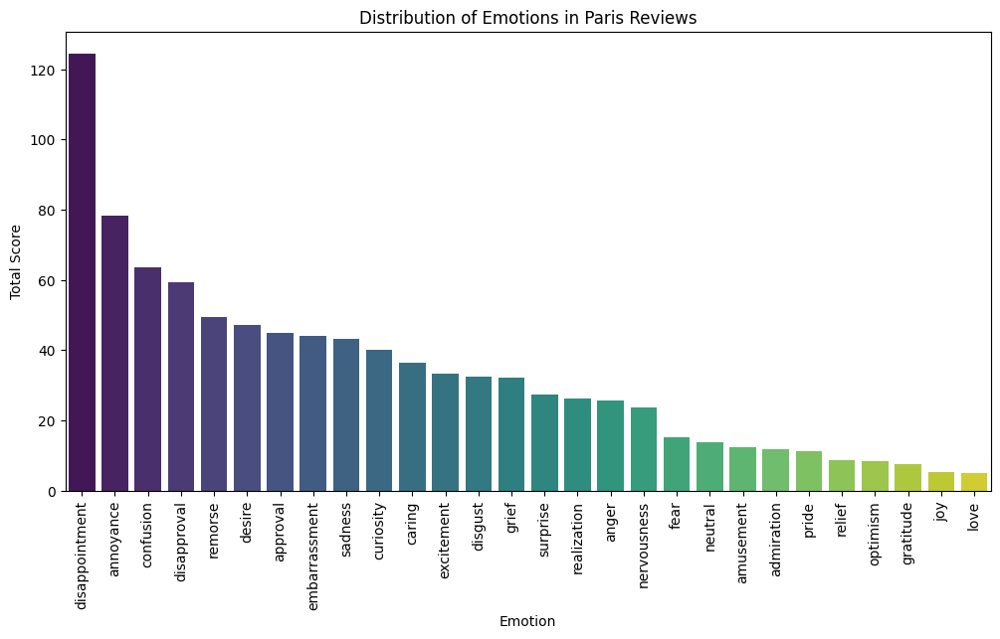

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

# Convert the results into a flat list of emotions
emotion_counts = Counter()

for review in emotions_1_Paris:  # Iterate over each review
    for emotion in review:  # Iterate over each detected emotion in the review
        emotion_counts[emotion['label']] += emotion['score']  # Add up the score of each emotion

# Sort emotions from highest to lowest total score
sorted_emotions = sorted(emotion_counts.items(), key=lambda x: x[1], reverse=True)

# Convert to separate lists
labels, scores = zip(*sorted_emotions)

# Create the sorted bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x=list(labels), y=list(scores), palette="viridis")

plt.xticks(rotation=90)
plt.xlabel("Emotion")
plt.ylabel("Total Score")
plt.title("Distribution of Emotions in Paris Reviews")
plt.show()

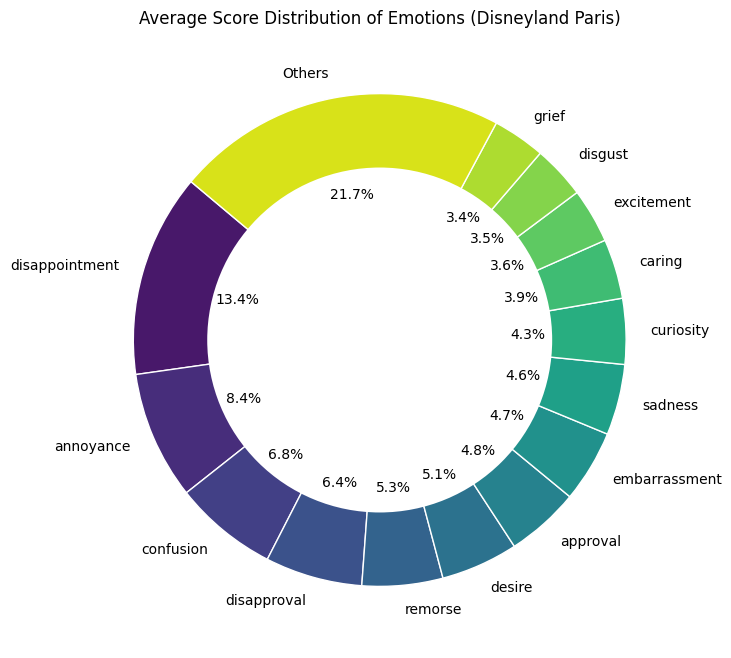

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Set a threshold (e.g., group emotions with <5% into "Others")
threshold = 3  # Adjust as needed
total = sum(emotion_1_Paris_df["Average Score"])  # Total sum of averages

# Create a new DataFrame for grouping
filtered_df = emotion_1_Paris_df.copy()
filtered_df["Percentage"] = (filtered_df["Average Score"] / total) * 100

# Separate emotions above and below the threshold
main_emotions = filtered_df[filtered_df["Percentage"] >= threshold]
others = filtered_df[filtered_df["Percentage"] < threshold]

# Sum the "Others" category
if not others.empty:
    others_row = pd.DataFrame([{"Emotion": "Others", "Average Score": others["Average Score"].sum(), "Percentage": others["Percentage"].sum()}])
    main_emotions = pd.concat([main_emotions, others_row])

# Extract labels and values
labels = main_emotions["Emotion"]
sizes = main_emotions["Average Score"]

# Plot the donut chart
plt.figure(figsize=(8, 8))
colors = sns.color_palette("viridis", len(labels))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors, wedgeprops={'edgecolor': 'white'})

# Add a white center circle for the donut effect
center_circle = plt.Circle((0, 0), 0.70, fc='white')
plt.gca().add_artist(center_circle)

# Title
plt.title("Average Score Distribution of Emotions (Disneyland Paris)")

# Show the chart
plt.show()



In [ ]:
#Full sentiment analysis to analyze negative reviews in California
df4=df.copy()
filtered_reviews_1_California = df4[(df4['Rating'] == 1) & (df4['Branch'] == 'Disneyland_California')].copy()
filtered_reviews_1_California

# Load the GoEmotions tokenizer (based on BERT)
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")
# This tokenizer breaks text into tokens that the model can understand.

# BERT-based models can only process 512 tokens at a time.
# If a review is longer than 512 tokens, it needs to be split into smaller chunks.

# Apply the function to each review and flatten the list
filtered_reviews_1_California = filtered_reviews_1_California['Review_Text'].apply(lambda x: split_long_reviews(x)).explode().tolist()

# Verify that long reviews were correctly split
print(f"Total number of fragments to analyze: {len(filtered_reviews_1_California)}")
print(f"Example of a fragment:\n{filtered_reviews_1_California[0]}")


emotion_classifier = pipeline("text-classification",
                              model="joeddav/distilbert-base-uncased-go-emotions-student",truncation=True,
                              top_k=None)
# Aply GoEmotions, Runs the classifier on all processed reviews (all_reviews).
emotions_1_California = emotion_classifier(filtered_reviews_1_California)

# prints detected emotions
print(emotions_1_California)

Token indices sequence length is longer than the specified maximum sequence length for this model (691 > 512). Running this sequence through the model will result in indexing errors


Total number of fragments to analyze: 544
Example of a fragment:
i ve been to disneyland several times in the past 3 decades. this visit, i sensed the employees were disgruntled or unhappy. very few smiles from the staff. in addition, the staff was prowling for people crossing the ropes while fantasmic was on. why do we need a fastpass to enter to watch the fan tasmic show when everyone has been situated and there is tons of space for paying customers without a fastpass? see attached picture. through the whole show, the entire space was unoccupied while there were 5 8 yr olds next to us straining to catch a glimpse. if you wanna pay $ 129 to stand in line for hours to ride an average of 9 rides that last 3 to 11 minute, this is the place for you. disneyland has become so greedy that they overcrowd by double capacity just to make money without a care for their customers. it s ridiculous to have minimal places to sit and rest with this large of a park. i highly recommend universal studio

Device set to use cpu


[[{'label': 'annoyance', 'score': 0.09973322600126266}, {'label': 'confusion', 'score': 0.08594068884849548}, {'label': 'desire', 'score': 0.07893262803554535}, {'label': 'nervousness', 'score': 0.07293961942195892}, {'label': 'curiosity', 'score': 0.06960222870111465}, {'label': 'approval', 'score': 0.06268509477376938}, {'label': 'disapproval', 'score': 0.04807078465819359}, {'label': 'disappointment', 'score': 0.04791365563869476}, {'label': 'remorse', 'score': 0.047524578869342804}, {'label': 'caring', 'score': 0.043242380023002625}, {'label': 'excitement', 'score': 0.03947901353240013}, {'label': 'sadness', 'score': 0.039364464581012726}, {'label': 'realization', 'score': 0.035711511969566345}, {'label': 'grief', 'score': 0.028634674847126007}, {'label': 'embarrassment', 'score': 0.027984431013464928}, {'label': 'anger', 'score': 0.0264192596077919}, {'label': 'disgust', 'score': 0.02093779668211937}, {'label': 'surprise', 'score': 0.019483137875795364}, {'label': 'fear', 'score':

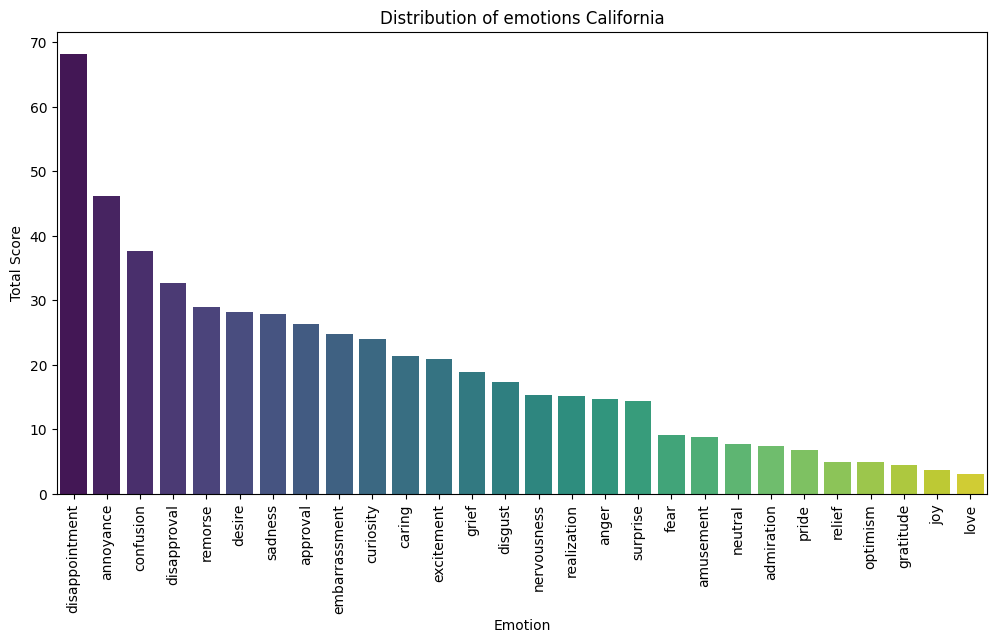

In [ ]:
# Convert the results into a flat list of emotions
emotion_counts = Counter()

for review in emotions_1_California:
    for emotion in review:
        emotion_counts[emotion['label']] += emotion['score']

# Sort emotions from highest to lowest total score
sorted_emotions = sorted(emotion_counts.items(), key=lambda x: x[1], reverse=True)

# Convert to separate lists
labels, scores = zip(*sorted_emotions)

# Create the sorted bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x=list(labels), y=list(scores), palette="viridis")

plt.xticks(rotation=90)
plt.xlabel("Emotion")
plt.ylabel("Total Score")
plt.title("Distribution of emotions California")
plt.show()

In [ ]:
#Full sentiment analysis to analyze negative reviews in other countries
df5=df.copy()
filtered_reviews_1_HongKong = df5[(df5['Rating'] == 1) & (df5['Branch'] == 'Disneyland_HongKong')].copy()
filtered_reviews_1_HongKong


# Load the GoEmotions tokenizer (based on BERT)
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")
# This tokenizer breaks text into tokens that the model can understand.

# BERT-based models can only process 512 tokens at a time.
# If a review is longer than 512 tokens, it needs to be split into smaller chunks.

# Apply the function to each review and flatten the list
filtered_reviews_1_HongKong = filtered_reviews_1_HongKong['Review_Text'].apply(lambda x: split_long_reviews(x)).explode().tolist()

# Verify that long reviews were correctly split
print(f"Total number of fragments to analyze: {len(filtered_reviews_1_HongKong)}")
print(f"Example of a fragment:\n{filtered_reviews_1_HongKong[0]}")


emotion_classifier = pipeline("text-classification",
                              model="joeddav/distilbert-base-uncased-go-emotions-student",truncation=True,
                              top_k=None)
# Aply GoEmotions, Runs the classifier on all processed reviews (all_reviews).
emotions_1_HongKong = emotion_classifier(filtered_reviews_1_HongKong)

# prints detected emotions
print(emotions_1_HongKong)


Token indices sequence length is longer than the specified maximum sequence length for this model (942 > 512). Running this sequence through the model will result in indexing errors


Total number of fragments to analyze: 179
Example of a fragment:
the main attractions were shut while we still paid the full entrance fees, without any intimation either online or as the ticket kiosks


Device set to use cpu


[[{'label': 'approval', 'score': 0.08217258751392365}, {'label': 'desire', 'score': 0.07311403006315231}, {'label': 'excitement', 'score': 0.06897928565740585}, {'label': 'caring', 'score': 0.06571109592914581}, {'label': 'realization', 'score': 0.05922863632440567}, {'label': 'remorse', 'score': 0.056955497711896896}, {'label': 'curiosity', 'score': 0.05695449188351631}, {'label': 'surprise', 'score': 0.0408066101372242}, {'label': 'disapproval', 'score': 0.04020489752292633}, {'label': 'confusion', 'score': 0.03941832482814789}, {'label': 'annoyance', 'score': 0.03715724125504494}, {'label': 'nervousness', 'score': 0.03611472249031067}, {'label': 'neutral', 'score': 0.03095988929271698}, {'label': 'amusement', 'score': 0.0305075254291296}, {'label': 'admiration', 'score': 0.030108654871582985}, {'label': 'pride', 'score': 0.029774492606520653}, {'label': 'relief', 'score': 0.028947336599230766}, {'label': 'grief', 'score': 0.02570979669690132}, {'label': 'optimism', 'score': 0.021190

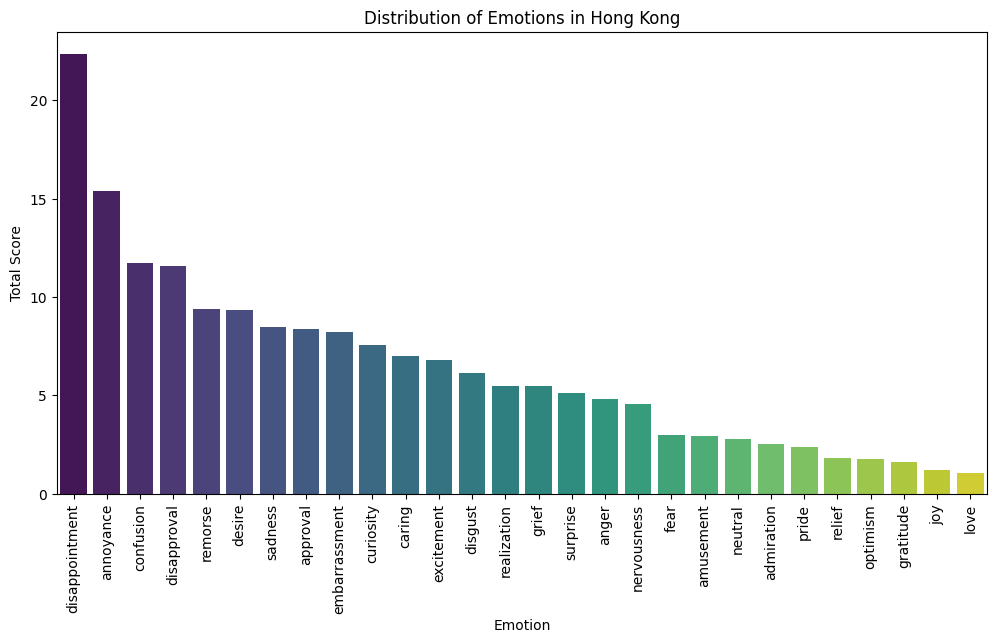

In [ ]:
# Convert the results into a flat list of emotions
emotion_counts = Counter()

for review in emotions_1_HongKong:  # Iterate over each review
    for emotion in review:  # Iterate over each detected emotion in the review
        emotion_counts[emotion['label']] += emotion['score']  # Sum the score of each emotion

# Sort emotions from highest to lowest total score
sorted_emotions = sorted(emotion_counts.items(), key=lambda x: x[1], reverse=True)

# Convert to separate lists
labels, scores = zip(*sorted_emotions)

# Create the sorted bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x=list(labels), y=list(scores), palette="viridis")

plt.xticks(rotation=90)
plt.xlabel("Emotion")
plt.ylabel("Total Score")
plt.title("Distribution of Emotions in Hong Kong")
plt.show()
